# Store Sales Time Series Forecasting 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/transactions.csv


## Importing Packages

In [90]:
# Setup notebook
from pathlib import Path
from learntools.time_series.style import *  # plot style settings
from learntools.time_series.utils import plot_periodogram, seasonal_plot, make_lags, make_leads, plot_lags, make_multistep_target, plot_multistep

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

from sklearn.metrics import mean_squared_log_error
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_log_error
from sklearn.preprocessing import LabelEncoder

#Configuration 
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
# ---------------------------------------------------

In [3]:
#Model 1
from pyearth import Earth
from sklearn.linear_model import LinearRegression, ElasticNet, Lasso, Ridge

In [5]:
#Model 2
from sklearn.ensemble import ExtraTreesRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from xgboost import XGBRegressor

## Importing Data

In [5]:
train = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/train.csv')
test = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/test.csv')

stores = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/stores.csv')
transactions = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/transactions.csv').sort_values(['store_nbr', 'date'])

#Datetime
train['date'] = pd.to_datetime(train.date)
test['date'] = pd.to_datetime(test.date)
transactions['date'] = pd.to_datetime(transactions.date)

In [6]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [7]:
transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [8]:
train.info()
train.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


Index(['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion'], dtype='object')

In [11]:
avg_sales = train.groupby("date").agg({"sales" : "mean"}).reset_index()
avg_sales['weekly avg sales'] = avg_sales['sales'].ewm(span = 7, adjust = False).mean()

avg_transactions = transactions.groupby("date").agg({'transactions' : 'mean'}).reset_index()
avg_transactions['weekly avg transactions'] = avg_transactions['transactions'].ewm(span = 7, adjust = False).mean()

ax1 = px.line( avg_sales, x = 'date', y=['sales', 'weekly avg sales'], title = 'Average Weekly Sales')

ax2 = px.line(avg_transactions, x = 'date', y=['transactions', 'weekly avg transactions'], title = 'Average Weekly Transactions')

ax1.show()
ax2.show()

In [12]:
tem = pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), transactions, how = "left")

print("Spearman correlation sales and transactions: {:.4f}".format(tem.corr("spearman").sales.loc["transactions"]))

px.line(transactions.sort_values(["store_nbr", "date"]), x = "date", y="transactions", color = "store_nbr", title = "Transactions by Store Locations")

Spearman correlation sales and transactions: 0.8175


All Stores Have a spike in transactions at the end of the year with some minor spikes in Spring -> Early summer

In [17]:
tran = transactions.copy()
tran['year'] = tran.date.dt.year
tran['month'] = tran.date.dt.month
px.box(tran, x="year", y = "transactions", color = "month", title = "Monthly Transactions")

**December has the the highest Transactions for all the years**

In [19]:
trans = transactions.set_index("date").resample("M").transactions.mean().reset_index()
trans["year"] = trans.date.dt.year
px.line(trans, x = 'date', y ='transactions', color = 'year', title = "Average Monthly Transactions")

Transactions increase at the end of the year and begining of spring, declining from summer months to winter with some spikes in August. 

In [22]:
px.scatter(tem, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = 'green')

Strong Correlation between `Transactions` and `Sales` with few outliers

In [26]:
tran['dayofweek'] = tran.date.dt.dayofweek+1 #Monday starts at 0
tran_w = tran.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(tran_w, x = "dayofweek", y = "transactions", color = 'year', title = "Transactions on the Day of the week")


Weekends have more transactions and Saturday has the highest transactions ---> sales

### Oil Prices

In [28]:
#Oil Date given
oil = pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/oil.csv')
oil['date'] = pd.to_datetime(oil.date)
#Resample
oil = oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()

#Linear Interpolation for missing values
oil['dcoilwtico'] = np.where(oil['dcoilwtico'] == 0, np.nan, oil['dcoilwtico'])
oil["dcoilwtico_interpolated"] = oil.dcoilwtico.interpolate()

#plotting
oilp = oil.melt(id_vars=['date'] + list(oil.keys()[5:]), var_name = 'Legend')
px.line(oilp.sort_values(["Legend", "date"], ascending = [True, False]), x = 'date', y = 'value', color = 'Legend', title = "Daily Oil Prices")

#### Oil prices impact on Sales and `Transactions`

In [33]:
ost = pd.merge(tem, oil, how = "left")
print("Correlation to daily oil prices: \n", ost.drop(["store_nbr", "dcoilwtico"], axis = 1).corr("spearman")\
      .dcoilwtico_interpolated.loc[["sales", "transactions"]], "\n")

Correlation to daily oil prices: 
 sales          -0.30
transactions    0.04
Name: dcoilwtico_interpolated, dtype: float64 



Text(0.5, 1.0, 'Daily Oil Prices & Transactions')

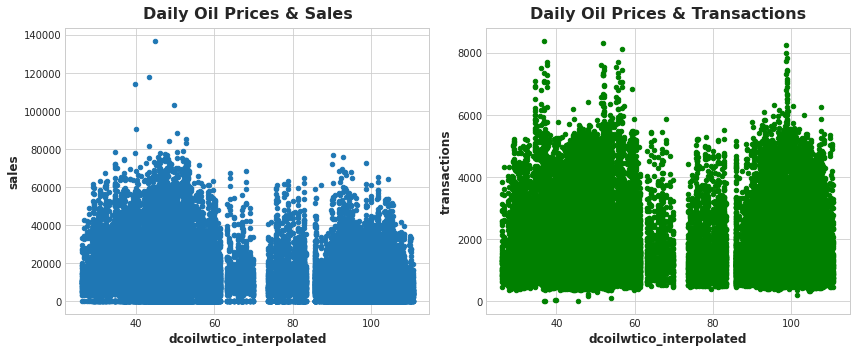

In [41]:
fig, axes = plt.subplots(1 , 2, figsize=(12,5))
ost.plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax = axes[0])
ost.plot.scatter(x = "dcoilwtico_interpolated", y = "transactions", ax = axes[1], color = 'g')
axes[0].set_title("Daily Oil Prices & Sales")
axes[1].set_title("Daily Oil Prices & Transactions")

Lower oil prices seem to have higher sales but further investigation is needed 

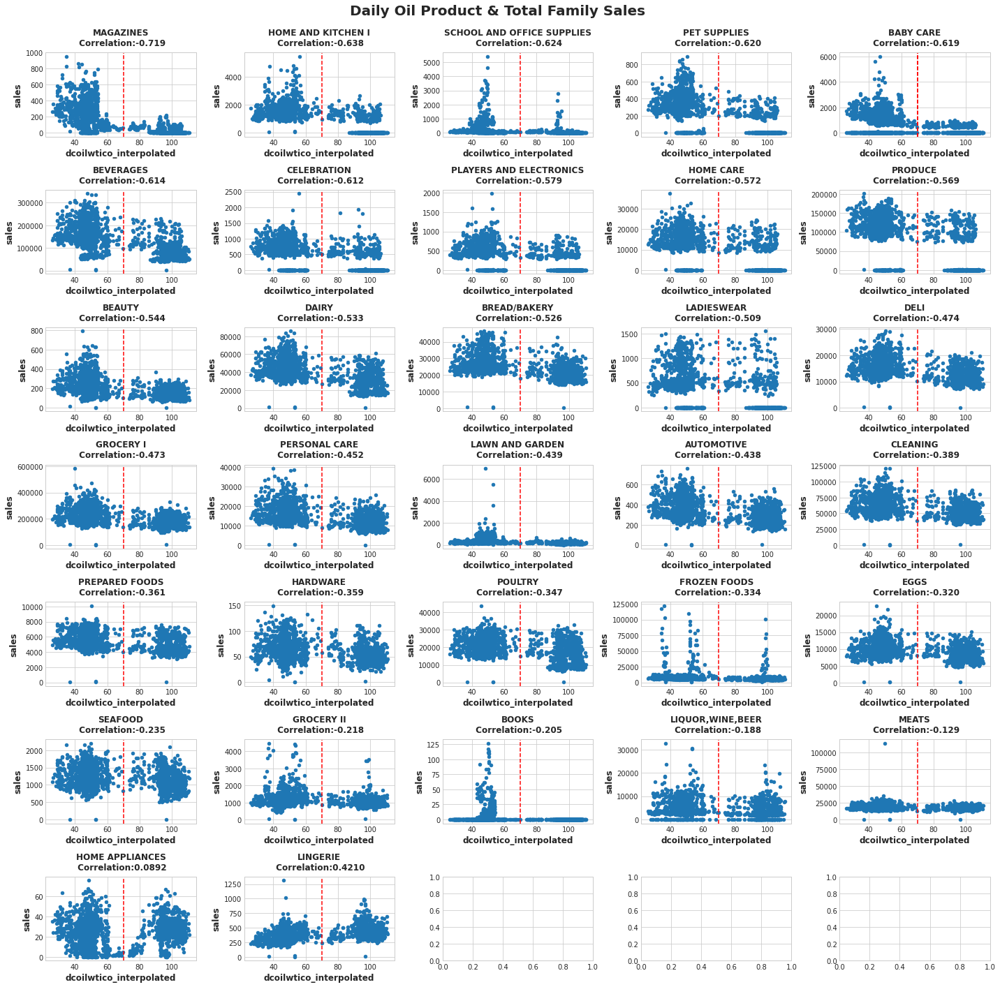

In [42]:
a = pd.merge(train.groupby(["date", "family"]).sales.sum().reset_index(), oil.drop("dcoilwtico", axis = 1), how = "left")
c = a.groupby("family").corr("spearman").reset_index()
c = c[c.level_1 == "dcoilwtico_interpolated"][["family", "sales"]].sort_values("sales")

fig, axes = plt.subplots(7, 5, figsize = (20,20))
for i, fam in enumerate(c.family):
    if i < 6:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[0, i-1])
        axes[0, i-1].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[0, i-1].axvline(x=70, color='r', linestyle='--')
    if i >= 6 and i<11:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[1, i-6])
        axes[1, i-6].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[1, i-6].axvline(x=70, color='r', linestyle='--')
    if i >= 11 and i<16:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[2, i-11])
        axes[2, i-11].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[2, i-11].axvline(x=70, color='r', linestyle='--')
    if i >= 16 and i<21:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[3, i-16])
        axes[3, i-16].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[3, i-16].axvline(x=70, color='r', linestyle='--')
    if i >= 21 and i<26:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[4, i-21])
        axes[4, i-21].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[4, i-21].axvline(x=70, color='r', linestyle='--')
    if i >= 26 and i < 31:
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[5, i-26])
        axes[5, i-26].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[5, i-26].axvline(x=70, color='r', linestyle='--')
    if i >= 31 :
        a[a.family == fam].plot.scatter(x = "dcoilwtico_interpolated", y = "sales", ax=axes[6, i-31])
        axes[6, i-31].set_title(fam+"\n Correlation:"+str(c[c.family == fam].sales.iloc[0])[:6], fontsize = 12)
        axes[6, i-31].axvline(x=70, color='r', linestyle='--')
        
        
plt.tight_layout(pad=5)
plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize = 20);
plt.show()

## Sales

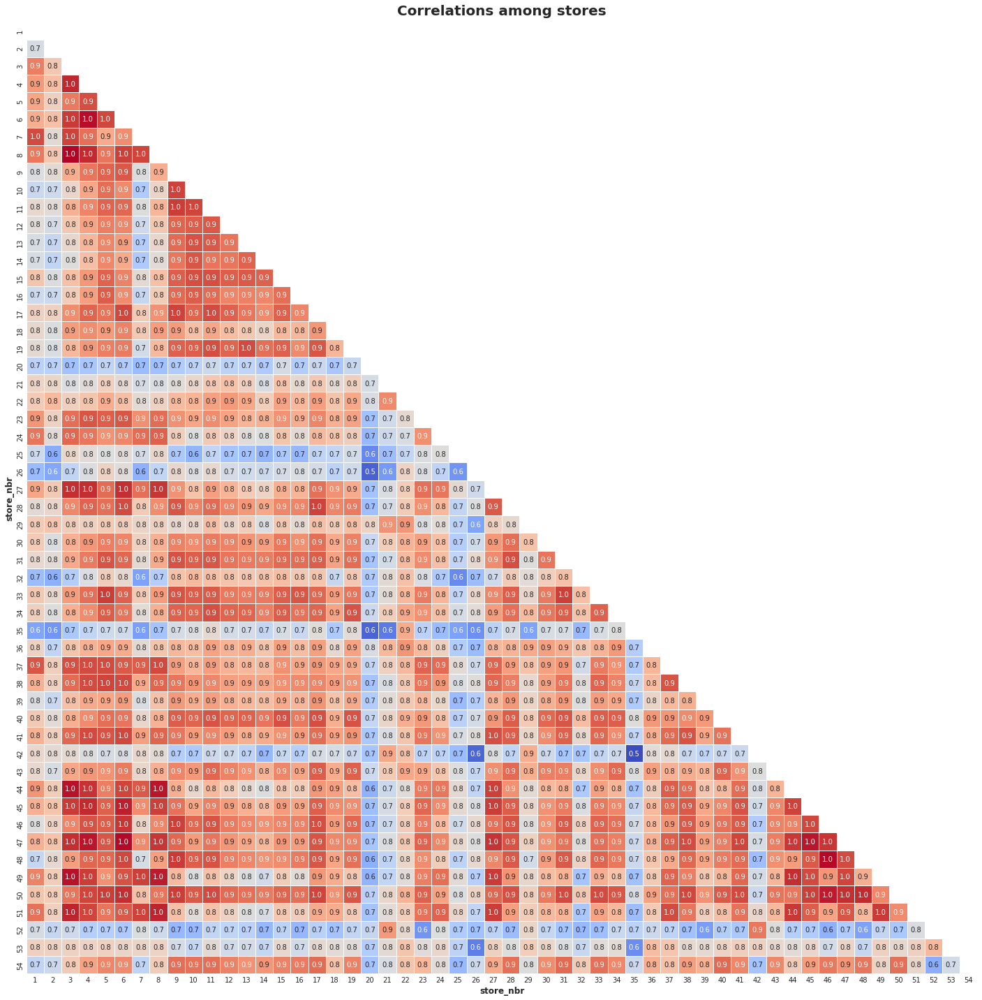

In [45]:
snbr = train[["store_nbr", "sales"]]
snbr["ind"] = 1
snbr["ind"] = snbr.groupby("store_nbr").ind.cumsum().values
snbr = pd.pivot(snbr, index = "ind", columns = "store_nbr", values = "sales").corr()
mask = np.triu(snbr.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(snbr,
        annot=True,
        fmt='.1f',
        cmap='coolwarm',
        square=True,
        mask=mask,
        linewidths=1,
        cbar=False)
plt.title("Correlations among stores",fontsize = 20)
plt.show()

In [43]:
dts = train.set_index("date").groupby("store_nbr").resample("D").sales.sum().reset_index()
px.line(dts, x= "date", y="sales", color = "store_nbr", title = "Daily total sales of all Stores")

Some stores have no sales earlier in the period since they were not open at the time

In [44]:
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < "2017-04-20"))]
train = train[~((train.store_nbr == 22) & (train.date < "2015-10-09"))]
train = train[~((train.store_nbr == 42) & (train.date < "2015-08-21"))]
train = train[~((train.store_nbr == 21) & (train.date < "2015-07-24"))]
train = train[~((train.store_nbr == 29) & (train.date < "2015-03-20"))]
train = train[~((train.store_nbr == 20) & (train.date < "2015-02-13"))]
train = train[~((train.store_nbr == 53) & (train.date < "2014-05-29"))]
train = train[~((train.store_nbr == 36) & (train.date < "2013-05-09"))]
train.shape

(3000888, 6)


(2780316, 6)

Removing product families with zero salses since some stores do not have any sales in those categories 

In [46]:
zefo = train.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family", "store_nbr"])
zefo = zefo[zefo.sales == 0]
zefo

,store_nbr,family,sales
1,1,BABY CARE,0.00
397,13,BABY CARE,0.00
727,23,BABY CARE,0.00
1420,44,BABY CARE,0.00
1453,45,BABY CARE,0.00
1486,46,BABY CARE,0.00
1519,47,BABY CARE,0.00
1552,48,BABY CARE,0.00
1585,49,BABY CARE,0.00
1618,50,BABY CARE,0.00


In [50]:
import gc

print(train.shape)
rem = train.merge(zefo.drop("sales", axis = 1), how = 'outer', indicator = True)
train = rem[~(rem._merge == 'both')].drop('_merge', axis = 1)
del rem
gc.collect()
train.shape

(2780316, 6)


(2698648, 6)

In [53]:
tsf = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(tsf, x = "date", y = "sales", color = "family", title = "Daily Total Sales by Family")

In [14]:
pfs = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(pfs, x = "sales", y ="family", color = "family", title = "Product Family Sales")

In [22]:
px.pie(pfs, values='sales', names='family', title = "Product Family Sales", height = 1000, width = 1000)

## Holiday and Events

In [27]:
comp_dir = Path('../input/store-sales-time-series-forecasting')

holidays_events = pd.read_csv(
    comp_dir / "holidays_events.csv",
    dtype={
        'type': 'category',
        'locale': 'category',
        'locale_name': 'category',
        'description': 'category',
        'transferred': 'bool',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)

Average Holiday Sales is type
Additional   479.50
Bridge       446.75
Event        425.66
Holiday      367.95
Transfer     460.52
Work Day     372.16
Name: sales, dtype: float64


Text(0.5, 1.0, 'Holiday Sales')

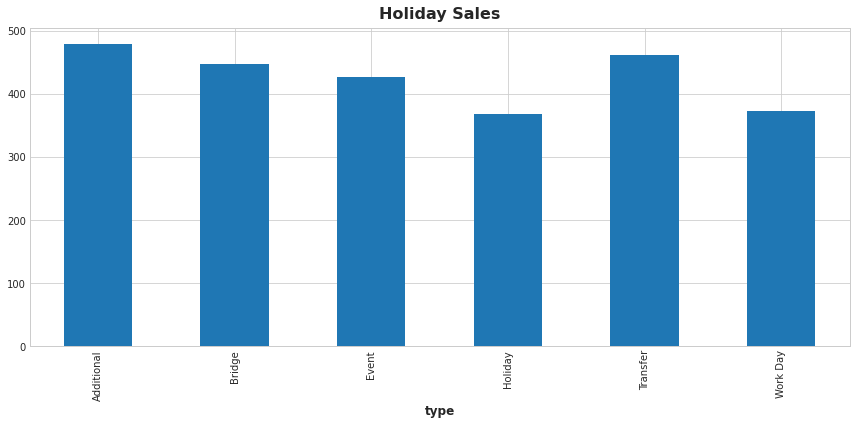

In [34]:
holiday_sales = pd.merge_asof(holidays_events[['date', 'type']], avg_sales[['date', 'sales']])
holiday_sales.dropna(inplace = True)
holiday_sales.reset_index(drop = True, inplace = True)

avg_holiday_sales = holiday_sales.groupby('type').mean()['sales']
avg__holiday_sales = avg_holiday_sales.mean()
print(f"Average Holiday Sales is {avg_holiday_sales}")
avg_holiday_sales.plot(kind='bar', figsize = (12,6)).set_title("Holiday Sales")

In [37]:
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(12, 6),
    titlesize=18,
    titleweight='bold',
)

plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)

# Use it for the Lag_1 plot later.
plot_params = dict(
    color = '0.75',
    style = ".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)

In [49]:
avg_sales['Time'] = np.arange(len(avg_sales.index))
avg_sales.head()

,date,sales,weekly avg sales,Time
0,2013-01-01,1.41,1.41,0
1,2013-01-02,278.39,70.65,1
2,2013-01-03,202.84,103.70,2
3,2013-01-04,198.91,127.50,3
4,2013-01-05,267.87,162.60,4


Text(0.5, 1.0, 'Sales Time Plot')

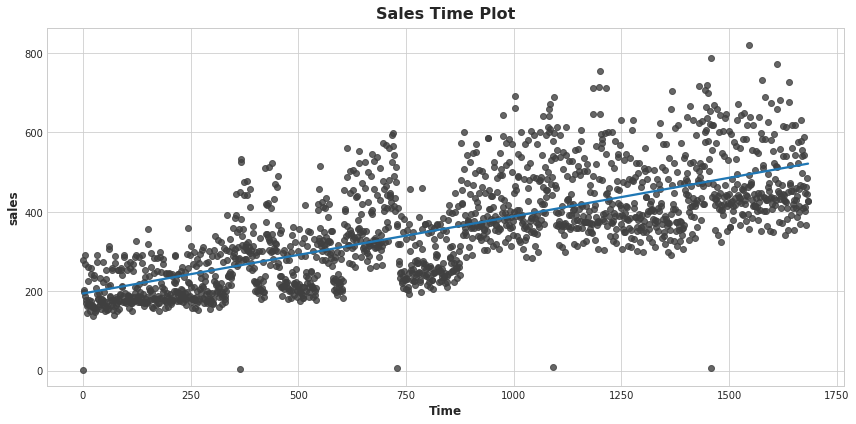

In [54]:
ax = sns.regplot(x="Time", y = "sales", data = avg_sales, ci = None, scatter_kws=dict(color='0.25') )
ax.set_title("Sales Time Plot")

## Competition Data

In [17]:
comp_dir = Path('../input/store-sales-time-series-forecasting')


store_sales = pd.read_csv(
    comp_dir / 'train.csv',
    usecols=['store_nbr', 'family', 'date', 'sales'],
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()
average_sales = (
    store_sales
    .groupby('date').mean()['sales']
)

#Holiday and Events
holidays_events = pd.read_csv(
    comp_dir / "holidays_events.csv",
    dtype={
        'type': 'category',
        'locale': 'category',
        'locale_name': 'category',
        'description': 'category',
        'transferred': 'bool',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
holidays_events = holidays_events.set_index('date').to_period('D')

print("Training Data", "\n", store_sales)

Training Data 
                                  sales
store_nbr family     date             
1         AUTOMOTIVE 2013-01-01   0.00
                     2013-01-02   2.00
                     2013-01-03   3.00
                     2013-01-04   3.00
                     2013-01-05   5.00
...                                ...
9         SEAFOOD    2017-08-11  23.83
                     2017-08-12  16.86
                     2017-08-13  20.00
                     2017-08-14  17.00
                     2017-08-15  16.00

[3000888 rows x 1 columns]


In [7]:
#Test Data: test.csv
df_test = pd.read_csv(comp_dir / 'test.csv',
                     dtype = {
                         'store_nbr' : 'category',
                         'family' : 'category',
                         'onpromotion' : 'uint32'
                     },
                     parse_dates = ['date'],
                     infer_datetime_format = True)
df_test['date'] = df_test.date.dt.to_period('D')
df_test = df_test.set_index(['store_nbr', 'family', 'date']).sort_index()
print("test Data", "\n", df_test)

test Data 
                                       id  onpromotion
store_nbr family     date                            
1         AUTOMOTIVE 2017-08-16  3000888            0
                     2017-08-17  3002670            0
                     2017-08-18  3004452            0
                     2017-08-19  3006234            0
                     2017-08-20  3008016            0
...                                  ...          ...
9         SEAFOOD    2017-08-27  3022271            0
                     2017-08-28  3024053            0
                     2017-08-29  3025835            0
                     2017-08-30  3027617            0
                     2017-08-31  3029399            0

[28512 rows x 2 columns]


# Exploratory Data Analysis (EDA)

**Date Ranges**

In [8]:
print(f"Training data: {store_sales.index.get_level_values(2).min()} to {store_sales.index.get_level_values(2).max()}")
print(f"Testing data: {df_test.index.get_level_values(2).min()} to {df_test.index.get_level_values(2).max()}")

Training data: 2013-01-01 to 2017-08-15
Testing data: 2017-08-16 to 2017-08-31


In [10]:
print(f"Product family: {len(store_sales.index.unique(level=1))}")

Product family: 33


In [11]:
print(f"Number of stores: {len(store_sales.index.unique(level=0))}")

Number of stores: 54


# Time Dependence Modeling

**Trends**

In [18]:
average_sales.head()

date
2013-01-01     1.41
2013-01-02   278.39
2013-01-03   202.84
2013-01-04   198.91
2013-01-05   267.87
Freq: D, Name: sales, dtype: float32

In [19]:
trend = average_sales.rolling(window = 365,
                             center = True,
                             min_periods = 183,).mean()

Text(0.5, 0, '')

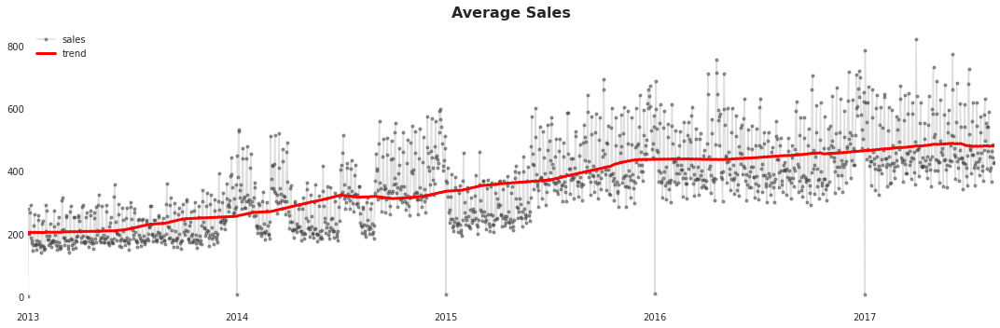

In [20]:
fig, ax = plt.subplots(figsize=(15,5))
average_sales.plot(**plot_params, alpha=0.5, title="Average Sales", ax=ax)
trend.plot(linewidth=3, label='trend', color='r', ax=ax)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.grid(False)
ax.legend();
ax.set_xlabel("")

**First Prediction**

Sales grow year-on-year, that can be approximated using a linear regressor
Using `DeterministicProcess` function to create a feature set

**Polynomical Order: 1**

In [21]:
# Target values 
poly_y = average_sales.copy()
poly_y.head()

date
2013-01-01     1.41
2013-01-02   278.39
2013-01-03   202.84
2013-01-04   198.91
2013-01-05   267.87
Freq: D, Name: sales, dtype: float32

In [23]:
dP1 = DeterministicProcess(index = poly_y.index,
                          constant = True,
                          order = 1,
                          drop = True)
X1 = dP1.in_sample()

X1.head()

,const,trend
date,,
2013-01-01,1.00,1.00
2013-01-02,1.00,2.00
2013-01-03,1.00,3.00
2013-01-04,1.00,4.00
2013-01-05,1.00,5.00


Train Test Split for the last 15 days to test the model

 Polynomial Order 1 Training RMSLE: 0.32472
 Polynomial Order 1 Validation RMSLE: 0.18144


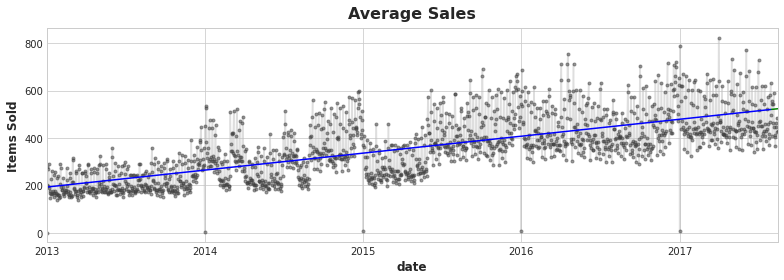

In [25]:
X1_train, X1_valid, poly_y_train, poly_y_valid = train_test_split(X1, poly_y, test_size = 15, shuffle = False)

model_1 = LinearRegression(fit_intercept = False).fit(X1_train, poly_y_train)
y1_fit = pd.Series(model_1.predict(X1_train), index=X1_train.index).clip(0.0)
y1_pred = pd.Series(model_1.predict(X1_valid), index = X1_valid.index).clip(0.0)

rmsle_train_1 = mean_squared_log_error(poly_y_train, y1_fit) **0.5
rmsle_valid_1 = mean_squared_log_error(poly_y_valid, y1_pred) **0.5
print(f" Polynomial Order 1 Training RMSLE: {rmsle_train_1:.5f}")
print(f" Polynomial Order 1 Validation RMSLE: {rmsle_valid_1:.5f}")

ax = poly_y.plot(**plot_params, alpha = 0.5, title = "Average Sales", ylabel = "Items Sold")
ax = y1_fit.plot(ax=ax, label = "Fitted", color='blue')
ax = y1_pred.plot(ax=ax, label = "Forecast", color = 'green')

**Polynomial Order: 3**

In [26]:
dP3 = DeterministicProcess(index = poly_y.index,
                          constant = True,
                          order = 3, 
                          drop = True)
X3 = dP3.in_sample()
X3.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2013-01-01,1.00,1.00,1.00,1.00
2013-01-02,1.00,2.00,4.00,8.00
2013-01-03,1.00,3.00,9.00,27.00
2013-01-04,1.00,4.00,16.00,64.00
2013-01-05,1.00,5.00,25.00,125.00


 Polynomial Order 3 Training RMSLE: 0.32328
 Polynomial Order 3 Validation RMSLE: 0.14174


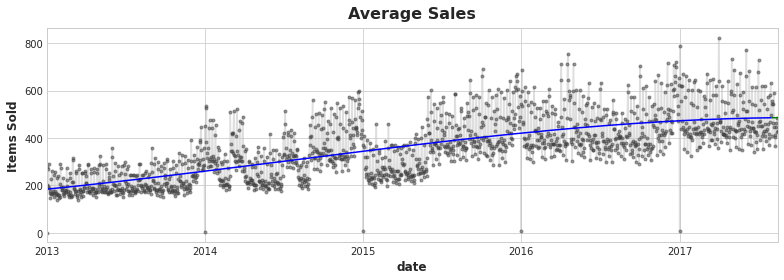

In [31]:
X3_train, X3_valid, poly_y3_train, poly_y3_valid = train_test_split(X3, poly_y, test_size = 15, shuffle = False)

model_3 = LinearRegression(fit_intercept = False).fit(X3_train, poly_y3_train)
y3_fit = pd.Series(model_3.predict(X3_train), index=X3_train.index).clip(0.0)
y3_pred = pd.Series(model_3.predict(X3_valid), index = X3_valid.index).clip(0.0)

rmsle_train_3 = mean_squared_log_error(poly_y3_train, y3_fit) **0.5
rmsle_valid_3 = mean_squared_log_error(poly_y3_valid, y3_pred) **0.5
print(f" Polynomial Order 3 Training RMSLE: {rmsle_train_3:.5f}")
print(f" Polynomial Order 3 Validation RMSLE: {rmsle_valid_3:.5f}")

ax = poly_y.plot(**plot_params, alpha = 0.5, title = "Average Sales", ylabel = "Items Sold")
ax = y3_fit.plot(ax=ax, label = "Fitted", color='blue')
ax = y3_pred.plot(ax=ax, label = "Forecast", color = 'green')

Polynomial Order 3 generalizes better for the validation test, although they perform similar on the training set. 

**Average Sales vs Per item sales**

In [32]:
y = store_sales.unstack(['store_nbr', 'family'])
y.head()

sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01       0.00      0.00   0.00      0.00  0.00         0.00   
2013-01-02       2.00      0.00   2.00   1091.00  0.00       470.65   
2013-01-03       3.00      0.00   0.00    919.00  0.00       310.65   
2013-01-04       3.00      0.00   3.00    953.00  0.00       198.37   
2013-01-05       5.00      0.00   3.00   1160.00  0.00       301.06   

                                                                             \
store_nbr                                                                     
family     CELEBRATION CLEANING  DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                          
2013-01-01        0.00     0.00   0.00   0.00   0.00         0.00      0.00   
2013-01-02        0.00  1060.00 579.00 164.07 246.00       131.00   2652.00   
2013-01-03        0.00   836.00 453.00 151.58 203.00        87.04   2121.00   
2013-01-04        0.00   827.00 460.00 131.41 171.00        65.00   2056.00   
2013-01-05        0.00   811.00 464.00 118.61 177.00        70.00   2216.00   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2013-01-01       0.00     0.00               0.00                0.00   
2013-01-02      31.00     3.00               0.00                0.00   
2013-01-03      12.00     1.00               0.00                0.00   
2013-01-04      15.00     7.00               0.00                0.00   
2013-01-05      30.00     1.00               0.00                0.00   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2013-01-01            0.00      0.00       0.00            0.00     0.00   
2013-01-02            0.00      0.00       0.00           10.00    13.00   
2013-01-03            2.00      0.00       0.00            0.00    15.00   
2013-01-04            0.00      0.00       0.00            7.00    24.00   
2013-01-05            0.00      0.00       0.00           10.00    20.00   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2013-01-01             0.00      0.00   0.00          0.00         0.00   
2013-01-02            67.00      0.00 369.10        194.00         0.00   
2013-01-03            66.00      0.00 272.32        153.00         0.00   
2013-01-04           102.00      0.00 454.17         88.00         0.00   
2013-01-05           159.00      0.00 328.94        141.00         0.00   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2013-01-01                    0.00    0.00           0.00    0.00   
2013-01-02                    0.00  247.30          47.00    0.00   
2013-01-03                    0.00  187.28          63.00    0.00   
2013-01-04                    0.00  258.02          67.00    0.00   
2013-01-05                    0.00  212.33          66.00    0.00   

                       

In [33]:
dp = DeterministicProcess(index = y.index,
                          constant = True,
                          order = 3, 
                          drop = True)
X = dp.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2013-01-01,1.00,1.00,1.00,1.00
2013-01-02,1.00,2.00,4.00,8.00
2013-01-03,1.00,3.00,9.00,27.00
2013-01-04,1.00,4.00,16.00,64.00
2013-01-05,1.00,5.00,25.00,125.00


In [34]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y_train.columns).clip(0.0)
y_pred = pd.DataFrame(model.predict(X_valid), index=X_valid.index, columns=y_valid.columns).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

y_pred.head()

Training RMSLE: 1.08942
Validation RMSLE: 0.59417


sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-08-01       3.99      0.00   3.53   2196.63  0.72       343.64   
2017-08-02       3.99      0.00   3.53   2196.55  0.72       343.37   
2017-08-03       3.99      0.00   3.54   2196.47  0.72       343.11   
2017-08-04       3.98      0.00   3.54   2196.39  0.72       342.84   
2017-08-05       3.98      0.00   3.54   2196.30  0.72       342.57   

                                                                             \
store_nbr                                                                     
family     CELEBRATION CLEANING  DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                          
2017-08-01       14.87   652.08 723.40 125.15 138.66       124.39   2712.00   
2017-08-02       14.86   651.98 723.32 125.08 138.68       124.34   2712.45   
2017-08-03       14.85   651.87 723.23 125.01 138.70       124.30   2712.89   
2017-08-04       14.84   651.77 723.15 124.94 138.72       124.25   2713.34   
2017-08-05       14.83   651.66 723.06 124.88 138.74       124.20   2713.78   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2017-08-01      22.06     2.08              17.97               19.47   
2017-08-02      22.07     2.08              17.95               19.42   
2017-08-03      22.08     2.08              17.92               19.37   
2017-08-04      22.09     2.08              17.90               19.32   
2017-08-05      22.11     2.08              17.87               19.26   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2017-08-01            0.63    166.82      13.03           22.29     8.32   
2017-08-02            0.63    166.72      13.02           22.35     8.34   
2017-08-03            0.63    166.62      13.01           22.40     8.36   
2017-08-04            0.64    166.52      13.00           22.45     8.38   
2017-08-05            0.64    166.42      12.99           22.51     8.40   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2017-08-01            90.44      6.68 328.46        137.37         5.87   
2017-08-02            90.35      6.67 328.63        137.30         5.87   
2017-08-03            90.26      6.67 328.79        137.23         5.87   
2017-08-04            90.17      6.66 328.96        137.15         5.87   
2017-08-05            90.08      6.65 329.13        137.08         5.87   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2017-08-01                    8.23  356.36          70.81 2411.14   
2017-08-02                    8.21  356.80          70.74 2409.72   
2017-08-03                    8.20  357.23          70.67 2408.29   
2017-08-04                    8.19  357.66          70.60 2406.85   
2017-08-05                    8.17  358.10          70.53 2405.40   

                       

In [35]:
X_test = dp.out_of_sample(steps = 16)
X_test.index.name = 'date'

X_test.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2017-08-16,1.00,1685.00,2839225.00,4784094125.00
2017-08-17,1.00,1686.00,2842596.00,4792616856.00
2017-08-18,1.00,1687.00,2845969.00,4801149703.00
2017-08-19,1.00,1688.00,2849344.00,4809692672.00
2017-08-20,1.00,1689.00,2852721.00,4818245769.00


In [36]:
y_final = pd.DataFrame(model.predict(X_test), index = X_test.index, columns = y.columns)
y_final = y_final.stack(['store_nbr', 'family'])
y_final = y_final.join(df_test.id).reindex(columns = ['id', 'sales'])
y_final.head()

id   sales
date       store_nbr family                     
2017-08-16 1         AUTOMOTIVE  3000888    3.96
                     BABY CARE   3000889    0.00
                     BEAUTY      3000890    3.57
                     BEVERAGES   3000891 2195.19
                     BOOKS       3000892    0.74

**2017 Data**

In [37]:
y = store_sales.unstack(['store_nbr', 'family']).loc["2017"]
y.head()

sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-01-01       0.00      0.00   0.00      0.00  0.00         0.00   
2017-01-02       5.00      0.00   0.00   1434.00  0.00       166.82   
2017-01-03       4.00      0.00   4.00   3081.00  2.00       519.35   
2017-01-04       1.00      0.00   4.00   3039.00  2.00       543.25   
2017-01-05       2.00      0.00   3.00   2617.00  0.00       533.48   

                                                                              \
store_nbr                                                                      
family     CELEBRATION CLEANING   DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                           
2017-01-01        0.00     0.00    0.00   0.00   0.00         0.00      0.00   
2017-01-02        0.00   332.00  376.00  44.98  76.00        72.15   1218.00   
2017-01-03       15.00   952.00 1045.00 209.30 202.00       124.18   3507.00   
2017-01-04       17.00  1055.00 1029.00 135.94 197.00       115.00   3665.00   
2017-01-05       40.00   918.00  853.00 137.01 159.00       157.51   3085.00   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2017-01-01       0.00     0.00               0.00                0.00   
2017-01-02       8.00     0.00               4.00                2.00   
2017-01-03      15.00     3.00              36.00               40.00   
2017-01-04      27.00     3.00              36.00               31.00   
2017-01-05      35.00     3.00              30.00               19.00   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2017-01-01            0.00      0.00       0.00            0.00     0.00   
2017-01-02            0.00    108.00       4.00            4.00     4.00   
2017-01-03            0.00    294.00      19.00           16.00    13.00   
2017-01-04            0.00    274.00      18.00           12.00     7.00   
2017-01-05            0.00    242.00      11.00            9.00     5.00   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2017-01-01             0.00      0.00   0.00          0.00         0.00   
2017-01-02            25.00      1.00 116.72         81.00         5.00   
2017-01-03           104.00      1.00 344.58        258.00        10.00   
2017-01-04           115.00      6.00 326.20        243.00         6.00   
2017-01-05            79.00      6.00 274.20        188.00         8.00   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2017-01-01                    0.00    0.00           0.00    0.00   
2017-01-02                    4.00  140.38          59.36 1319.88   
2017-01-03                    9.00  408.05         108.37 3558.44   
2017-01-04                    8.00  495.95          74.85 4830.27   
2017-01-05                   11.00  329.31         112.27 2896.17   

              

In [38]:
dp = DeterministicProcess(index = y.index,
                          constant = True,
                          order = 3, 
                          drop = True)
X = dp.in_sample()
X.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2017-01-01,1.00,1.00,1.00,1.00
2017-01-02,1.00,2.00,4.00,8.00
2017-01-03,1.00,3.00,9.00,27.00
2017-01-04,1.00,4.00,16.00,64.00
2017-01-05,1.00,5.00,25.00,125.00


In [39]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y_train.columns).clip(0.0)
y_pred = pd.DataFrame(model.predict(X_valid), index=X_valid.index, columns=y_valid.columns).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

y_pred.head()

Training RMSLE: 0.62841
Validation RMSLE: 0.56709


sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-08-01       5.35      0.00   3.34   2124.13  0.09       338.77   
2017-08-02       5.39      0.00   3.34   2119.96  0.08       338.74   
2017-08-03       5.44      0.00   3.34   2115.66  0.07       338.72   
2017-08-04       5.48      0.00   3.33   2111.24  0.06       338.71   
2017-08-05       5.53      0.00   3.33   2106.69  0.05       338.71   

                                                                             \
store_nbr                                                                     
family     CELEBRATION CLEANING  DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                          
2017-08-01       14.90   645.66 672.19 137.82 135.87       122.97   2550.13   
2017-08-02       14.86   644.92 671.44 138.22 135.55       122.74   2549.54   
2017-08-03       14.81   644.17 670.69 138.62 135.21       122.50   2548.98   
2017-08-04       14.77   643.40 669.94 139.04 134.87       122.24   2548.44   
2017-08-05       14.72   642.61 669.20 139.47 134.53       121.98   2547.94   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2017-08-01      21.06     1.79              20.56               27.27   
2017-08-02      20.92     1.78              20.37               27.46   
2017-08-03      20.78     1.77              20.18               27.65   
2017-08-04      20.63     1.77              19.97               27.84   
2017-08-05      20.48     1.76              19.76               28.04   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2017-08-01            1.05    190.48      14.70           20.13     3.37   
2017-08-02            1.07    191.23      14.80           20.15     3.18   
2017-08-03            1.09    192.00      14.90           20.17     3.00   
2017-08-04            1.11    192.78      15.00           20.20     2.80   
2017-08-05            1.13    193.57      15.11           20.22     2.61   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2017-08-01            78.13      5.67 311.71        136.82         3.72   
2017-08-02            77.58      5.66 311.76        136.47         3.62   
2017-08-03            77.02      5.64 311.81        136.10         3.51   
2017-08-04            76.45      5.62 311.86        135.73         3.41   
2017-08-05            75.87      5.61 311.92        135.34         3.30   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2017-08-01                    8.10  340.93          74.74 2388.16   
2017-08-02                    8.09  341.12          75.58 2384.19   
2017-08-03                    8.08  341.30          76.44 2380.14   
2017-08-04                    8.07  341.48          77.33 2376.01   
2017-08-05                    8.06  341.66          78.25 2371.81   

                       

In [40]:
X_test = dp.out_of_sample(steps = 16)
X_test.index.name = 'date'

X_test.head()

,const,trend,trend_squared,trend_cubed
date,,,,
2017-08-16,1.00,228.00,51984.00,11852352.00
2017-08-17,1.00,229.00,52441.00,12008989.00
2017-08-18,1.00,230.00,52900.00,12167000.00
2017-08-19,1.00,231.00,53361.00,12326391.00
2017-08-20,1.00,232.00,53824.00,12487168.00


In [41]:
y_final = pd.DataFrame(model.predict(X_test), index = X_test.index, columns = y.columns)
y_final = y_final.stack(['store_nbr', 'family'])
y_final = y_final.join(df_test.id).reindex(columns = ['id', 'sales'])
y_final.head()

id   sales
date       store_nbr family                     
2017-08-16 1         AUTOMOTIVE  3000888    6.11
                     BABY CARE   3000889    0.00
                     BEAUTY      3000890    3.25
                     BEVERAGES   3000891 2048.06
                     BOOKS       3000892   -0.10

## Seasonality 

<AxesSubplot:title={'center':'Seasonal Plot (year/dayofyear)'}, xlabel='dayofyear', ylabel='sales'>

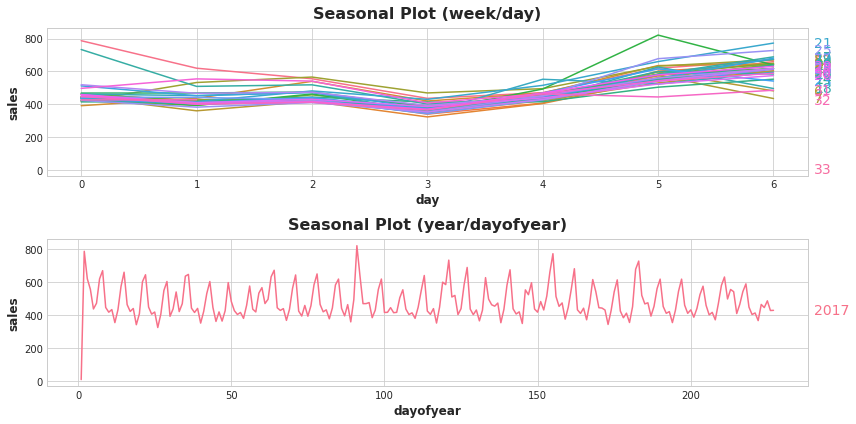

In [42]:
X = average_sales.loc['2017'].to_frame()

#days 
X['day'] = X.index.dayofweek
X['week'] = X.index.week

#days in a year
X['dayofyear'] = X.index.dayofyear
X['year'] = X.index.year

fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (12,6))
seasonal_plot(X, y = 'sales', period = 'week', freq = 'day', ax = ax1)
seasonal_plot(X, y = "sales", period = 'year', freq = 'dayofyear', ax = ax2)

<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

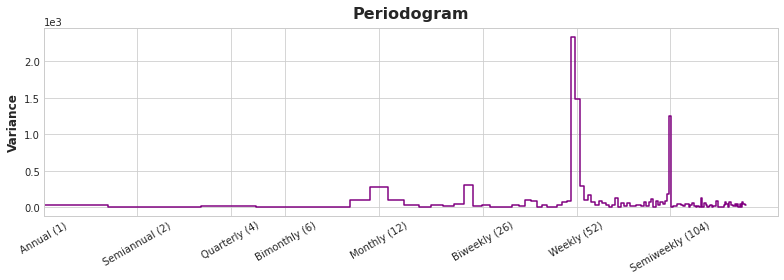

In [43]:
plot_periodogram(average_sales.loc['2017'])

### Seasonal Features 

In [50]:
y = store_sales.unstack(['store_nbr', 'family']).loc["2017"]

# Create training data
fourier = CalendarFourier(freq='M', order=4)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=True,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()

In [51]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y_train.columns).clip(0.0)
y_pred = pd.DataFrame(model.predict(X_valid), index=X_valid.index, columns=y_valid.columns).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

y_pred.head()

Training RMSLE: 0.62390
Validation RMSLE: 0.57367


sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-08-01       5.02      0.00   3.96   2244.46  0.39       328.94   
2017-08-02       5.65      0.00   4.01   2516.64  0.53       414.73   
2017-08-03       5.84      0.00   3.11   2238.22  0.24       372.60   
2017-08-04       7.12      0.00   2.88   2529.71  0.26       390.07   
2017-08-05       5.82      0.00   3.75   2684.33  0.02       414.93   

                                                                             \
store_nbr                                                                     
family     CELEBRATION CLEANING  DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                          
2017-08-01       16.71   764.30 707.89 145.30 138.71       113.93   2860.66   
2017-08-02       18.54   909.88 869.80 154.57 169.50       158.51   3233.80   
2017-08-03       22.47   764.98 743.35 131.14 138.66       145.95   2814.18   
2017-08-04       23.64   827.09 826.99 184.19 175.02       164.32   3103.37   
2017-08-05       15.46   739.81 832.19 156.17 184.58       151.62   3038.86   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2017-08-01      27.35     1.79              16.93               26.02   
2017-08-02      29.14     2.18              26.29               30.40   
2017-08-03      29.34     2.61              30.41               29.74   
2017-08-04      29.13     2.58              28.40               31.52   
2017-08-05      23.21     3.23              28.09               32.50   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2017-08-01            0.41    191.62      12.30           20.51    12.49   
2017-08-02            0.46    217.33      16.23           23.23    11.60   
2017-08-03            0.89    186.58      13.60           15.81    10.02   
2017-08-04            0.37    195.78      14.13           25.88    10.74   
2017-08-05            0.50    215.64      17.99           20.35    10.40   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2017-08-01            85.59      4.27 301.44        157.10         6.52   
2017-08-02           101.87      5.86 308.84        172.85         6.62   
2017-08-03           102.84      4.44 292.10        152.34         6.36   
2017-08-04           146.26      6.00 691.24        139.63         6.49   
2017-08-05           145.32      6.83 303.97        162.06         8.40   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2017-08-01                    7.93  335.20          42.57 2276.56   
2017-08-02                    9.39  394.37          62.75 4241.13   
2017-08-03                    8.55  336.17          63.48 2390.17   
2017-08-04                    8.88  558.51          74.16 2627.75   
2017-08-05                    8.98  335.63          64.23 2649.75   

                       

**Linear Trends and Seasonality Results**

In [52]:
X_test = dp.out_of_sample(steps = 16)
X_test.index.name = 'date'
X_test.head()

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)"
date,,,,,,,,,,,,,,,,
2017-08-16,1.00,228.00,0.00,0.00,1.00,0.00,0.00,0.00,0.10,-0.99,-0.20,0.98,0.30,-0.95,-0.39,0.92
2017-08-17,1.00,229.00,0.00,0.00,0.00,1.00,0.00,0.00,-0.10,-0.99,0.20,0.98,-0.30,-0.95,0.39,0.92
2017-08-18,1.00,230.00,0.00,0.00,0.00,0.00,1.00,0.00,-0.30,-0.95,0.57,0.82,-0.79,-0.61,0.94,0.35
2017-08-19,1.00,231.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.49,-0.87,0.85,0.53,-1.00,-0.05,0.90,-0.44
2017-08-20,1.00,232.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.65,-0.76,0.99,0.15,-0.85,0.53,0.30,-0.95


In [53]:
y_final = pd.DataFrame(model.predict(X_test), index = X_test.index, columns = y.columns)
y_final = y_final.stack(['store_nbr', 'family'])
y_final = y_final.join(df_test.id).reindex(columns = ['id', 'sales'])
y_final.head()

id   sales
date       store_nbr family                     
2017-08-16 1         AUTOMOTIVE  3000888    4.36
                     BABY CARE   3000889    0.00
                     BEAUTY      3000890    3.50
                     BEVERAGES   3000891 2464.82
                     BOOKS       3000892    0.55

**Residuals** 

In [54]:
y_train_avg = y_train.stack(['store_nbr', 'family']).groupby('date').mean()['sales']
y_fit_avg = y_fit.stack(['store_nbr', 'family']).groupby('date').mean()['sales']
y_deseason_avg = y_train_avg - y_fit_avg

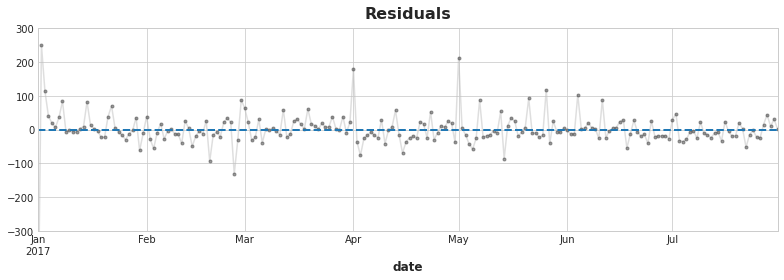

In [55]:
ax = y_deseason_avg.plot(**plot_params, alpha = 0.5, ylim=[-300, 300], title = "Residuals")
ax.axhline(y = 0, ls = 'dashed', lw =2)

In [ ]:
X['NewYear'] = (X.index.dayofyear == 1)

model = LinearRegression(fit_intercept=False)
model.fit(X, y)
y_pred = pd.DataFrame(model.predict(X), index=X.index, columns=y.columns)

Text(0.5, 1.0, 'Deseasonalised')

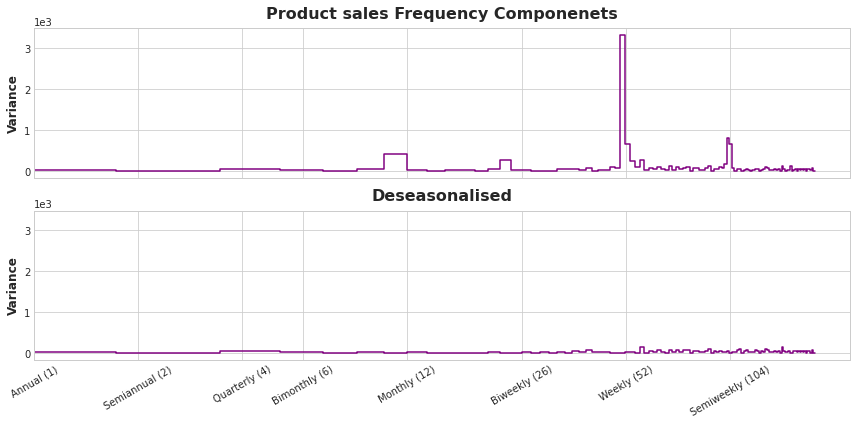

In [56]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex = True, sharey = True, figsize=(12,6))
ax1 = plot_periodogram(y_train_avg, ax=ax1)
ax1.set_title("Product sales Frequency Componenets")
ax2 = plot_periodogram(y_deseason_avg, ax=ax2)
ax2.set_title("Deseasonalised")

In [ ]:
STORE_NBR = '1'  # 1 - 54
FAMILY = 'PRODUCE'
# Uncomment to see a list of product families
# display(store_sales.index.get_level_values('family').unique())

ax = y.loc(axis=1)['sales', STORE_NBR, FAMILY].plot(**plot_params)
ax = y_pred.loc(axis=1)['sales', STORE_NBR, FAMILY].plot(ax=ax)
ax.set_title(f'{FAMILY} Sales at Store {STORE_NBR}');

**Holidays**

In [58]:
holidays_events.info()
holidays_events.head()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 350 entries, 2012-03-02 to 2017-12-26
Freq: D
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   type         350 non-null    category
 1   locale       350 non-null    category
 2   locale_name  350 non-null    category
 3   description  350 non-null    category
 4   transferred  350 non-null    bool    
dtypes: bool(1), category(4)
memory usage: 10.4 KB


,type,locale,locale_name,description,transferred
date,,,,,
2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [60]:
holidays = (holidays_events.query("locale in ['National', 'Regional']")
            .loc['2017' : '2017-08-15', ['description']]
            .assign(description = lambda x: x.description.cat.remove_unused_categories())
           )
holidays

,description
date,
2017-01-01,Primer dia del ano
2017-01-02,Traslado Primer dia del ano
2017-02-27,Carnaval
2017-02-28,Carnaval
2017-04-01,Provincializacion de Cotopaxi
2017-04-14,Viernes Santo
2017-05-01,Dia del Trabajo
2017-05-13,Dia de la Madre-1
2017-05-14,Dia de la Madre


Text(0.5, 1.0, 'National and REgional Holidays')

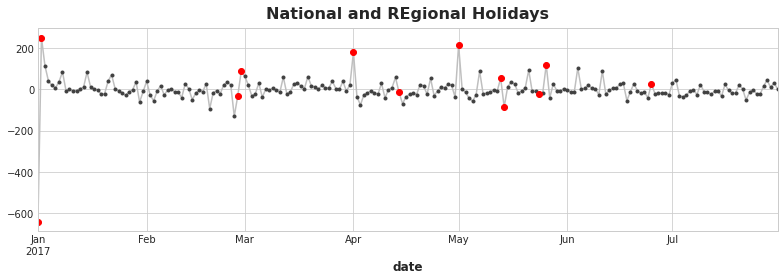

In [62]:
ax = y_deseason_avg.plot(**plot_params)
plt.plot_date(holidays.index[:-2], y_deseason_avg[holidays.index[:-2]], color = 'red') #removing dates in the test sets 
ax.set_title("National and REgional Holidays")

**One-hot-encoding Holidays**'

Can be indicators for categorical features 

In [68]:
X_holidays = pd.get_dummies(holidays)
X_holidays.head()

,description_Batalla de Pichincha,description_Carnaval,description_Dia de la Madre,description_Dia de la Madre-1,description_Dia del Trabajo,description_Primer Grito de Independencia,description_Primer dia del ano,description_Provincializacion de Cotopaxi,description_Provincializacion de Imbabura,description_Traslado Batalla de Pichincha,description_Traslado Primer Grito de Independencia,description_Traslado Primer dia del ano,description_Viernes Santo
date,,,,,,,,,,,,,
2017-01-01,0,0,0,0,0,0,1,0,0,0,0,0,0
2017-01-02,0,0,0,0,0,0,0,0,0,0,0,1,0
2017-02-27,0,1,0,0,0,0,0,0,0,0,0,0,0
2017-02-28,0,1,0,0,0,0,0,0,0,0,0,0,0
2017-04-01,0,0,0,0,0,0,0,1,0,0,0,0,0


In [69]:
X2 = X.join(X_holidays, on = 'date').fillna(0.0)
X2.head().T

date,2017-01-01,2017-01-02,2017-01-03,2017-01-04,2017-01-05
const,1.00,1.00,1.00,1.00,1.00
trend,1.00,2.00,3.00,4.00,5.00
"s(2,7)",0.00,1.00,0.00,0.00,0.00
"s(3,7)",0.00,0.00,1.00,0.00,0.00
"s(4,7)",0.00,0.00,0.00,1.00,0.00
"s(5,7)",0.00,0.00,0.00,0.00,1.00
"s(6,7)",0.00,0.00,0.00,0.00,0.00
"s(7,7)",0.00,0.00,0.00,0.00,0.00
"sin(1,freq=M)",0.00,0.20,0.39,0.57,0.72
"cos(1,freq=M)",1.00,0.98,0.92,0.82,0.69


In [70]:
X_train, X_valid, y_train, y_valid = train_test_split(X2, y, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y_train.columns).clip(0.0)
y_pred = pd.DataFrame(model.predict(X_valid), index=X_valid.index, columns=y_valid.columns).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

y_pred.head()

Training RMSLE: 0.51651
Validation RMSLE: 0.56997


sales                                                \
store_nbr           1                                                 
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2017-08-01       5.07      0.00   4.54   2409.25  0.47       366.46   
2017-08-02       5.59      0.00   4.46   2578.76  0.56       434.46   
2017-08-03       5.82      0.00   3.19   2235.19  0.25       373.73   
2017-08-04       7.46      0.00   2.85   2560.51  0.27       390.49   
2017-08-05       5.76      0.00   3.30   2557.56  0.00       385.89   

                                                                             \
store_nbr                                                                     
family     CELEBRATION CLEANING  DAIRY   DELI   EGGS FROZEN FOODS GROCERY I   
date                                                                          
2017-08-01       18.06   821.72 765.27 156.28 148.31       119.80   3057.49   
2017-08-02       19.52   930.47 893.58 158.09 173.52       160.21   3295.68   
2017-08-03       22.66   764.16 742.80 130.85 138.46       146.40   2810.39   
2017-08-04       24.42   837.82 833.71 187.27 176.37       168.51   3147.48   
2017-08-05       14.77   695.02 778.92 144.15 175.50       147.15   2868.40   

                                                                       \
store_nbr                                                               
family     GROCERY II HARDWARE HOME AND KITCHEN I HOME AND KITCHEN II   
date                                                                    
2017-08-01      28.39     1.85              19.01               28.59   
2017-08-02      30.00     2.21              27.76               31.18   
2017-08-03      29.39     2.55              30.63               29.98   
2017-08-04      30.17     2.57              28.32               32.07   
2017-08-05      22.31     3.25              27.24               31.77   

                                                                          \
store_nbr                                                                  
family     HOME APPLIANCES HOME CARE LADIESWEAR LAWN AND GARDEN LINGERIE   
date                                                                       
2017-08-01            0.44    208.70      13.91           22.42    13.42   
2017-08-02            0.51    224.38      17.48           24.32    12.10   
2017-08-03            0.95    186.58      13.92           15.52    10.04   
2017-08-04            0.45    196.59      14.08           25.41    10.64   
2017-08-05            0.53    202.72      17.26           16.27     9.61   

                                                                         \
store_nbr                                                                 
family     LIQUOR,WINE,BEER MAGAZINES  MEATS PERSONAL CARE PET SUPPLIES   
date                                                                      
2017-08-01            93.51      4.75 324.46        173.96         7.38   
2017-08-02           106.03      6.30 318.01        182.29         7.01   
2017-08-03           105.51      4.62 292.38        153.35         6.42   
2017-08-04           150.90      6.19 703.29        139.21         6.52   
2017-08-05           145.72      6.74 286.92        148.27         7.93   

                                                                   \
store_nbr                                                           
family     PLAYERS AND ELECTRONICS POULTRY PREPARED FOODS PRODUCE   
date                                                                
2017-08-01                    8.51  357.23          47.18 2469.98   
2017-08-02                    9.65  405.12          64.56 4336.72   
2017-08-03                    8.59  337.75          63.11 2395.94   
2017-08-04                    9.04  572.71          74.77 2638.79   
2017-08-05                    8.68  317.66          59.79 2492.52   

                       

**Based on Linear Trends, Seasonality, and Holidays**

In [71]:
X_test = dp.out_of_sample(steps = 16)
X_test.index.name = 'date'
X_test.head()

,const,trend,"s(2,7)","s(3,7)","s(4,7)","s(5,7)","s(6,7)","s(7,7)","sin(1,freq=M)","cos(1,freq=M)","sin(2,freq=M)","cos(2,freq=M)","sin(3,freq=M)","cos(3,freq=M)","sin(4,freq=M)","cos(4,freq=M)"
date,,,,,,,,,,,,,,,,
2017-08-16,1.00,228.00,0.00,0.00,1.00,0.00,0.00,0.00,0.10,-0.99,-0.20,0.98,0.30,-0.95,-0.39,0.92
2017-08-17,1.00,229.00,0.00,0.00,0.00,1.00,0.00,0.00,-0.10,-0.99,0.20,0.98,-0.30,-0.95,0.39,0.92
2017-08-18,1.00,230.00,0.00,0.00,0.00,0.00,1.00,0.00,-0.30,-0.95,0.57,0.82,-0.79,-0.61,0.94,0.35
2017-08-19,1.00,231.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.49,-0.87,0.85,0.53,-1.00,-0.05,0.90,-0.44
2017-08-20,1.00,232.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.65,-0.76,0.99,0.15,-0.85,0.53,0.30,-0.95


In [75]:
X2_test = X_test.join(X_holidays, on='date').fillna(0.0)

In [76]:
y_final = pd.DataFrame(model.predict(X2_test), index = X2_test.index, columns = y.columns)
y_final = y_final.stack(['store_nbr', 'family'])
y_final = y_final.join(df_test.id).reindex(columns = ['id', 'sales'])
y_final.head()

id   sales
date       store_nbr family                     
2017-08-16 1         AUTOMOTIVE  3000888    4.43
                     BABY CARE   3000889    0.00
                     BEAUTY      3000890    3.43
                     BEVERAGES   3000891 2436.38
                     BOOKS       3000892    0.53

In [77]:
X_time = X2
X_time_test = X2_test

## Serial Dependence Modeling

In [79]:
store_sales = pd.read_csv(
    comp_dir / 'train.csv',
    usecols=['store_nbr', 'family', 'date', 'sales', 'onpromotion'],
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'sales': 'float32',
        'onpromotion': 'uint32', ## NEW FEATURE: To be introduced later
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()

family_sales = (
    store_sales
    .groupby(['family', 'date'])
    .mean()
    .unstack('family')
    .loc['2017']
)

family_sales.head()

supply_sales = family_sales.loc(axis=1)[:, 'SCHOOL AND OFFICE SUPPLIES']
y_supply_sales = supply_sales.loc[:, 'sales'].squeeze()
y_supply_sales

date
2017-01-01    0.00
2017-01-02    2.93
2017-01-03    2.02
2017-01-04    1.72
2017-01-05    1.43
              ... 
2017-08-11   65.24
2017-08-12   67.48
2017-08-13   68.85
2017-08-14   52.33
2017-08-15   46.85
Freq: D, Name: SCHOOL AND OFFICE SUPPLIES, Length: 227, dtype: float32

### Cycles 

In [80]:
y_resid_train = y_train - y_fit
y_resid_valid = y_valid - y_pred

y_resid = pd.concat([y_resid_train, y_resid_valid])

In [84]:
y_resid_supply_sales = y_resid.stack(['store_nbr', 'family']).groupby(['family', 'date']).mean()\
.unstack('family').loc(axis=1)[:, 'SCHOOL AND OFFICE SUPPLIES'].loc[:, 'sales'].squeeze().rename('sales_deseason')
y_resid_supply_sales

date
2017-01-01   -0.00
2017-01-02   -0.00
2017-01-03   -3.05
2017-01-04   -2.34
2017-01-05   -1.98
              ... 
2017-08-11   61.42
2017-08-12   62.12
2017-08-13   61.35
2017-08-14   47.21
2017-08-15   41.97
Freq: D, Name: sales_deseason, Length: 227, dtype: float64

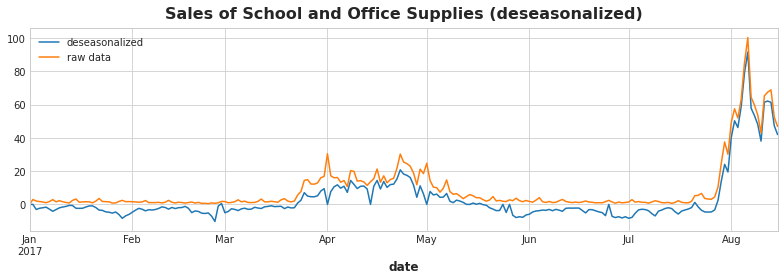

In [86]:
ax = y_resid_supply_sales.plot(label = 'deseasonalized')
y_supply_sales.plot(ax=ax, label = 'raw data')
ax.set_title("Sales of School and Office Supplies (deseasonalized)")
ax.legend()

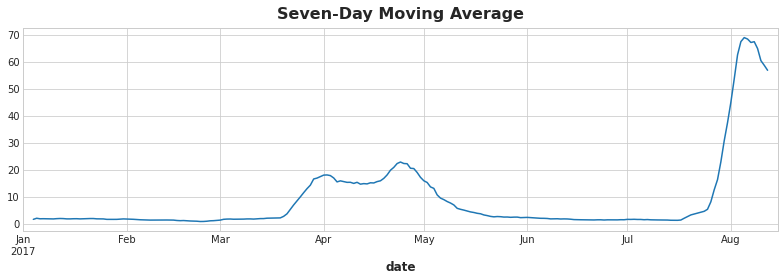

In [87]:
y_supply_sales_ma = y_supply_sales.rolling(
    window=7,       # 7-day window
    center=True,      # puts the average at the center of the window
).mean() 


# Plot
ax = y_supply_sales_ma.plot()
ax.set_title("Seven-Day Moving Average");

**Lag Series/plots: Calculating (partial) autocorrections**

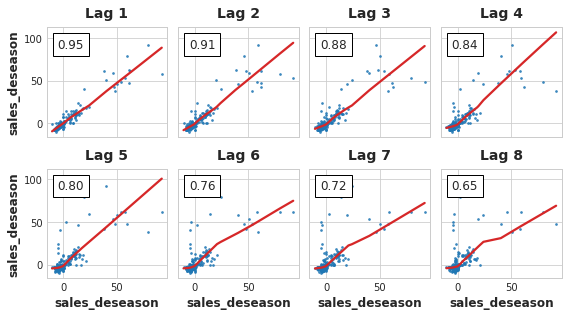

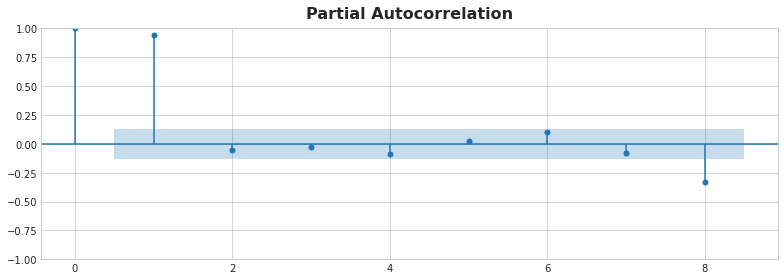

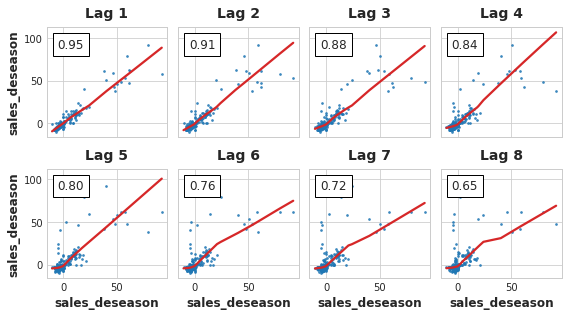

In [91]:
plot_pacf(y_resid_supply_sales, lags = 8)
plot_lags(y_resid_supply_sales, lags = 8, nrows =2)

In [92]:
X_lags = make_lags(y_resid_supply_sales, lags=1)

X_supply_sales = pd.concat([X_time, X_lags], axis=1).dropna()
print(f"Total features in our combined feature set: {len(X_supply_sales.columns)}")

Total features in our combined feature set: 30


In [93]:
y_supply_sales, X_supply_sales = y_supply_sales.align(X_supply_sales, join='inner')

Training RMSLE: 0.43198
Validation RMSLE: 0.24564


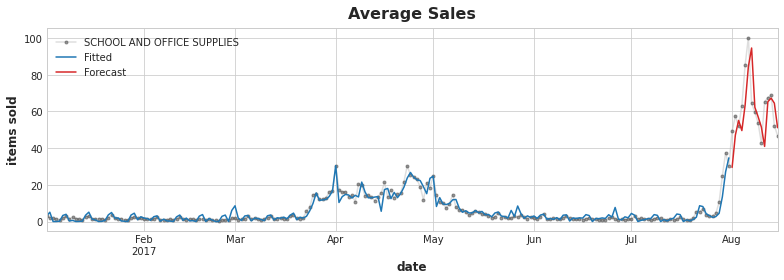

In [94]:
X_train_supply_sales, X_valid_supply_sales, y_train_supply_sales, y_valid_supply_sales = train_test_split(X_supply_sales, y_supply_sales, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train_supply_sales, y_train_supply_sales)
y_fit_supply_sales = pd.Series(model.predict(X_train_supply_sales), index=X_train_supply_sales.index).clip(0.0)
y_pred_supply_sales = pd.Series(model.predict(X_valid_supply_sales), index=X_valid_supply_sales.index).clip(0.0)

rmsle_train = mean_squared_log_error(y_train_supply_sales, y_fit_supply_sales) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid_supply_sales, y_pred_supply_sales) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

ax = y_supply_sales.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_fit_supply_sales.plot(ax=ax, label="Fitted", color='C0')
ax = y_pred_supply_sales.plot(ax=ax, label="Forecast", color='C3')
ax.legend();

### `onpromotion` is a Leading Indicator

In [95]:
y_supply_onpromotion = supply_sales.loc[:,'onpromotion'].squeeze()
y_supply_onpromotion

date
2017-01-01   0.00
2017-01-02   0.00
2017-01-03   0.00
2017-01-04   0.00
2017-01-05   0.00
             ... 
2017-08-11   2.67
2017-08-12   2.76
2017-08-13   2.78
2017-08-14   2.85
2017-08-15   2.74
Freq: D, Name: SCHOOL AND OFFICE SUPPLIES, Length: 227, dtype: float64

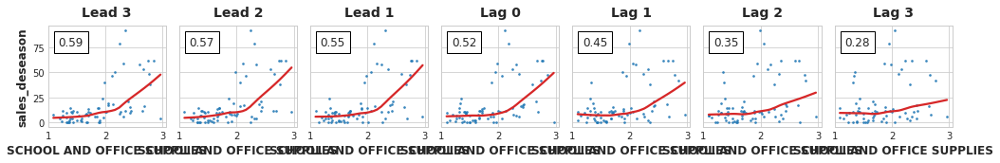

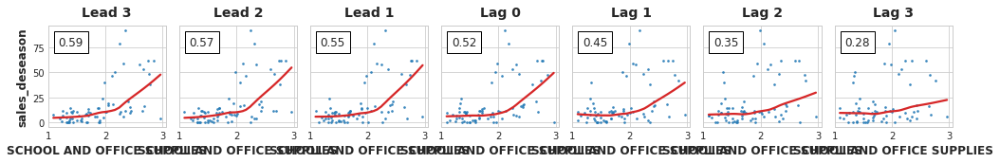

In [97]:
plot_lags(x = y_supply_onpromotion.loc[y_supply_onpromotion > 1], y=y_resid_supply_sales.loc[y_supply_onpromotion > 1], lags = 3, leads = 3, nrows=1)

Creating a Leading Indicator

In [98]:
X_promo = pd.concat([
    make_lags(y_supply_onpromotion, lags=1),
    y_supply_onpromotion,
    make_leads(y_supply_onpromotion, leads=1),
], axis=1)

In [99]:
X_supply_sales = pd.concat([X_time, X_lags, X_promo], axis =1).dropna()
print(f"Total features in our combined feature set: {len(X_supply_sales.columns)}")

Total features in our combined feature set: 33


In [100]:
y_supply_sales, X_supply_sales = y_supply_sales.align(X_supply_sales, join='inner')

Training RMSLE: 0.37214
Validation RMSLE: 0.31150


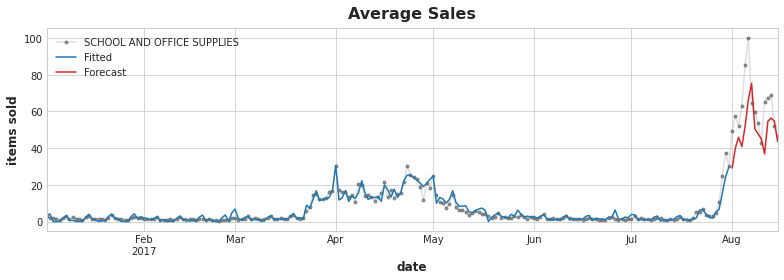

In [101]:
X_train_supply_sales, X_valid_supply_sales, y_train_supply_sales, y_valid_supply_sales = train_test_split(X_supply_sales, y_supply_sales, test_size=15, shuffle=False)

model = LinearRegression(fit_intercept=False).fit(X_train_supply_sales, y_train_supply_sales)
y_fit_supply_sales = pd.Series(model.predict(X_train_supply_sales), index=X_train_supply_sales.index).clip(0.0)
y_pred_supply_sales = pd.Series(model.predict(X_valid_supply_sales), index=X_valid_supply_sales.index).clip(0.0)

rmsle_train = mean_squared_log_error(y_train_supply_sales, y_fit_supply_sales) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid_supply_sales, y_pred_supply_sales) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

ax = y_supply_sales.plot(**plot_params, alpha=0.5, title="Average Sales", ylabel="items sold")
ax = y_fit_supply_sales.plot(ax=ax, label="Fitted", color='C0')
ax = y_pred_supply_sales.plot(ax=ax, label="Forecast", color='C3')
ax.legend();

# Combining Time and Serial Dependence: Hybrid Models

**Time Dependence**

In [104]:
# X_1: Time-dependence features

X_1 = X_time # training set time-features
X_1_test = X_time_test # test set time-features

# Splitting between training and validation sets

X_1_train, X_1_valid, y_train, y_valid = train_test_split(X_1, y, test_size=15, shuffle=False)

# Model 1: Ridge()

model_1 = Ridge().fit(X_1_train, y_train)

y_fit_1 = pd.DataFrame(model_1.predict(X_1_train), index=X_1_train.index, columns=y_train.columns).clip(0.0)
y_pred_1 = pd.DataFrame(model_1.predict(X_1_valid), index=X_1_valid.index, columns=y_valid.columns).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit_1) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred_1) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

Training RMSLE: 0.59491
Validation RMSLE: 0.56865


**Serial Dependence**

In [105]:
# X_2: Features for serial dependence
# onpromotion feature as a boolean variable
X_2 = store_sales.unstack(['store_nbr', 'family']).loc["2017"].loc[:, 'onpromotion']

# Label encoding for seasonality
X_2["day"] = X_2.index.day  # values are day of the month

# Splitting between training and validation sets
X_2_train, X_2_valid, y_train, y_valid = train_test_split(X_2, y, test_size=15, shuffle=False)

# Model 2: KNeighborsRegressor
model_2 = KNeighborsRegressor().fit(X_2_train, y_train - y_fit_1)

y_fit_2 = pd.DataFrame(model_2.predict(X_2_train), index=X_2_train.index, columns=y_train.columns).clip(0.0)
y_pred_2 = pd.DataFrame(model_2.predict(X_2_valid), index=X_2_valid.index, columns=y_valid.columns).clip(0.0)

y_fit = y_fit_1 + y_fit_2
y_pred = y_pred_1 + y_pred_2

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

Training RMSLE: 0.59272
Validation RMSLE: 0.58409


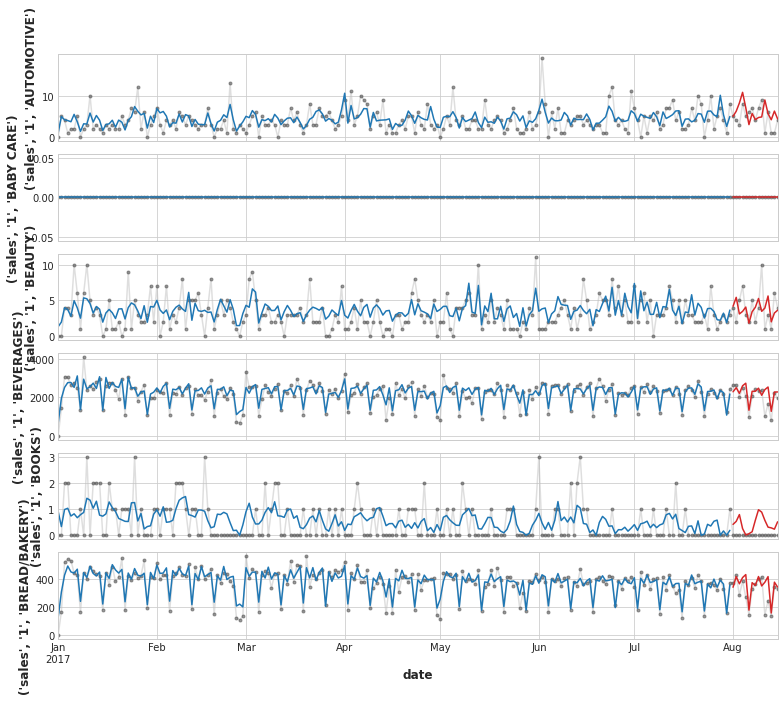

In [106]:
families = y.columns[0:6]
axs = y.loc(axis=1)[families].plot(
    subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5,
)
_ = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_ = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

### Boosted Hybrid Models

In [107]:
class BoostedHybrid:
    
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method
        
def fit(self, X_1, X_2, y):
    # Train model_1
    self.model_1.fit(X_1, y)

    # Make predictions
    y_fit = pd.DataFrame(
        self.model_1.predict(X_1), 
        index=X_1.index, columns=y.columns,
    )

    # Compute residuals
    y_resid = y - y_fit

    # Train model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # Save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid


# Add method to class
BoostedHybrid.fit = fit

def predict(self, X_1, X_2):
    # Predict with model_1
    y_pred = pd.DataFrame(
        self.model_1.predict(X_1), 
        index=X_1.index, columns=self.y_columns,
    )

    # Add model_2 predictions to model_1 predictions
    y_pred += self.model_2.predict(X_2)

    return y_pred


# Add method to class
BoostedHybrid.predict = predict

In [109]:
model = BoostedHybrid(
    model_1=Ridge(fit_intercept=False),
    model_2=KNeighborsRegressor(),
)

model.fit(X_1_train, X_2_train, y_train)
y_fit = model.predict(X_1_train, X_2_train).clip(0.0)
y_pred = model.predict(X_1_valid, X_2_valid).clip(0.0)

rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_valid, y_pred) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')
print(f'Validation RMSLE: {rmsle_valid:.5f}')

Training RMSLE: 0.52119
Validation RMSLE: 0.61597


### BoostedHybrid with liner time-dependence + non-linear (leading indicators only) serial dependence

In [110]:
# X_1_test: Time-dependence features: test set
X_1_test = X_time_test
# X_2_test: Serial-dependence features: test set
X_2_test = df_test.unstack(['store_nbr', 'family']).loc["2017"].loc[:, 'onpromotion']

# Label encoding for seasonality
X_2_test["day"] = X_2_test.index.day  # values are day of the month

# making submission predictions
y_submit = model.predict(X_1_test, X_2_test).clip(0.0)
y_submit = pd.DataFrame(y_submit.stack(['store_nbr', 'family']))#.rename('sales'))
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('submission_hybrid.csv', index=False)
y_submit

id   sales
date       store_nbr family                                     
2017-08-16 1         AUTOMOTIVE                  3000888    4.48
                     BABY CARE                   3000889    0.00
                     BEAUTY                      3000890    4.49
                     BEVERAGES                   3000891 2381.49
                     BOOKS                       3000892    0.30
...                                                  ...     ...
2017-08-31 9         POULTRY                     3029395  375.55
                     PREPARED FOODS              3029396  101.34
                     PRODUCE                     3029397 1275.18
                     SCHOOL AND OFFICE SUPPLIES  3029398    4.83
                     SEAFOOD                     3029399   18.40

[28512 rows x 2 columns]

In [112]:
# Credit: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None
        self.stack_cols = None
        self.y_resid = None

    def fit1(self, X_1, y, stack_cols=None):
        self.model_1.fit(X_1, y) # train model 1
        y_fit = pd.DataFrame(
            self.model_1.predict(X_1), # predict from model 1
            index=X_1.index,
            columns=y.columns,
        )
        self.y_resid = y - y_fit # residuals from model 1, which X2 may want to access to create lag (or other) features
        self.y_resid = self.y_resid.stack(stack_cols).squeeze()  # wide to long
        
    def fit2(self, X_2, first_n_rows_to_ignore, stack_cols=None):
        self.model_2.fit(X_2.iloc[first_n_rows_to_ignore*1782: , :], self.y_resid.iloc[first_n_rows_to_ignore*1782:]) # Train model_2
        self.y_columns = y.columns # Save for predict method
        self.stack_cols = stack_cols # Save for predict method

    def predict(self, X_1, X_2, first_n_rows_to_ignore):
        y_pred = pd.DataFrame(
            self.model_1.predict(X_1.iloc[first_n_rows_to_ignore: , :]),
            index=X_1.iloc[first_n_rows_to_ignore: , :].index,
            columns=self.y_columns,
        )
        y_pred = y_pred.stack(self.stack_cols).squeeze()  # wide to long
#         display(X_2.iloc[first_n_rows_to_ignore*1782: , :]) # uncomment when debugging
        y_pred += self.model_2.predict(X_2.iloc[first_n_rows_to_ignore*1782: , :]) # Add model_2 predictions to model_1 predictions
        return y_pred.unstack(self.stack_cols)

TRain-Test Split

In [118]:
store_sales_train = store_sales.unstack(['store_nbr', 'family']).loc['2017':'2017-07-31']
store_sales_valid = store_sales.unstack(['store_nbr', 'family']).loc['2017-08-01':]

Target (sales)

In [119]:
y_train = store_sales_train.loc[:, 'sales']
y_val = store_sales_valid.loc[:, 'sales']

In [120]:
mod_1 = LinearRegression() # for time-dependence
mod_2 = XGBRegressor() # for serial-dependence

model = BoostedHybrid(model_1=mod_1, model_2=mod_2)

In [121]:
# Trends/Seasonality
# Fourier features
fourier = CalendarFourier(freq='M', order=4) ## 2 pairs of sine/cosine curves to model monthly/biweekly seasonality
dp = DeterministicProcess(
    index=y_train.index,
    constant=True,               # dummy feature for bias (y-intercept)
    order=1,                     # cubic trend
    seasonal=True,               # weekly seasonality (indicators)
    additional_terms=[fourier],  # annual seasonality (fourier)
    drop=True,                   # drop terms to avoid collinearity
)

X_1_train = dp.in_sample()

# Seasonal indicators: Holidays
X_1_train = X_1_train.join(X_holidays, on='date').fillna(0.0)

In [122]:
model.fit1(X_1_train, y_train, stack_cols=['store_nbr', 'family'])

In [123]:
on_promotions = store_sales_train.drop('sales', axis=1).stack(['store_nbr', 'family'])
on_promotions

onpromotion
date       store_nbr family                                 
2017-01-01 1         AUTOMOTIVE                            0
                     BABY CARE                             0
                     BEAUTY                                0
                     BEVERAGES                             0
                     BOOKS                                 0
...                                                      ...
2017-07-31 9         POULTRY                               1
                     PREPARED FOODS                        0
                     PRODUCE                               6
                     SCHOOL AND OFFICE SUPPLIES            6
                     SEAFOOD                               0

[377784 rows x 1 columns]

In [124]:
# Source: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

# create feature set X2 for hybrid model 2, including helper functions
def encode_categoricals(df, columns):
    le = LabelEncoder()  # from sklearn.preprocessing
    for col in columns:
        df[col] = le.fit_transform(df[col])
    return df

def make_X2_lags(ts, lags, lead_time=1, name='y', stack_cols=None):
    ts = ts.unstack(stack_cols)
    df = pd.concat(
        {
            f'{name}_lag_{i}': ts.shift(i, freq="D") # freq adds i extra day(s) to end: only one extra day is needed so rest will be dropped
            for i in range(lead_time, lags + lead_time)
        },
        axis=1)
    df = df.stack(stack_cols).reset_index()
    df = encode_categoricals(df, stack_cols)
    df = df.set_index('date').sort_values(by=stack_cols) # return sorted so can correctly compute rolling means (if desired)
    return df

In [125]:
# Source: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

# promo_lag features
shifted_promo_df = make_X2_lags(on_promotions.squeeze(), lags=2, name='promo', stack_cols=['store_nbr', 'family'])
shifted_promo_df['promo_mean_rolling_7'] = shifted_promo_df['promo_lag_1'].rolling(window=7, center=False).mean()
shifted_promo_df['promo_median_rolling_91'] = shifted_promo_df['promo_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
shifted_promo_df['promo_median_rolling_162'] = shifted_promo_df['promo_lag_1'].rolling(window=162, center=False).median().fillna(method='bfill')
# for rolling window medians, backfilling seems reasonable as medians shouldn't change too much. Trying min_periods produced wacky (buggy?) results
shifted_promo_df

,store_nbr,family,promo_lag_1,promo_lag_2,promo_mean_rolling_7,promo_median_rolling_91,promo_median_rolling_162
date,,,,,,,
2017-01-02,0,0,0.00,NaN,NaN,0.00,0.00
2017-01-03,0,0,0.00,0.00,NaN,0.00,0.00
2017-01-04,0,0,0.00,0.00,NaN,0.00,0.00
2017-01-05,0,0,0.00,0.00,NaN,0.00,0.00
2017-01-06,0,0,0.00,0.00,NaN,0.00,0.00
...,...,...,...,...,...,...,...
2017-07-29,53,32,0.00,0.00,1.14,0.00,0.00
2017-07-30,53,32,4.00,0.00,1.14,0.00,0.00
2017-07-31,53,32,0.00,4.00,1.00,0.00,0.00


**Lag Series Features**

In [126]:
y_resid_1 = model.y_resid
y_resid_1

date        store_nbr  family                    
2017-01-01  1          AUTOMOTIVE                     0.00
                       BABY CARE                      0.00
                       BEAUTY                         0.00
                       BEVERAGES                      0.00
                       BOOKS                          0.00
                                                     ...  
2017-07-31  9          POULTRY                       39.38
                       PREPARED FOODS               -50.23
                       PRODUCE                       17.21
                       SCHOOL AND OFFICE SUPPLIES    46.18
                       SEAFOOD                       -5.23
Length: 377784, dtype: float64

In [127]:
# Source: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

# y_lag features
shifted_y_df = make_X2_lags(y_resid_1, lags=2, name='y_res', stack_cols=['store_nbr', 'family'])
shifted_y_df['y_mean_rolling_7'] = shifted_y_df['y_res_lag_1'].rolling(window=7, center=False).mean()
shifted_y_df['y_mean_rolling_14'] = shifted_y_df['y_res_lag_1'].rolling(window=14, center=False).mean()
shifted_y_df['y_mean_rolling_28'] = shifted_y_df['y_res_lag_1'].rolling(window=28, center=False).mean()
shifted_y_df['y_median_rolling_91'] = shifted_y_df['y_res_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
shifted_y_df['y_median_rolling_162'] = shifted_y_df['y_res_lag_1'].rolling(window=162, center=False).median().fillna(method='bfill')
shifted_y_df

,store_nbr,family,y_res_lag_1,y_res_lag_2,y_mean_rolling_7,y_mean_rolling_14,y_mean_rolling_28,y_median_rolling_91,y_median_rolling_162
date,,,,,,,,,
2017-01-02,0,0,0.00,NaN,NaN,NaN,NaN,-0.19,-0.16
2017-01-03,0,0,-0.00,0.00,NaN,NaN,NaN,-0.19,-0.16
2017-01-04,0,0,-0.10,-0.00,NaN,NaN,NaN,-0.19,-0.16
2017-01-05,0,0,-2.98,-0.10,NaN,NaN,NaN,-0.19,-0.16
2017-01-06,0,0,-1.72,-2.98,NaN,NaN,NaN,-0.19,-0.16
...,...,...,...,...,...,...,...,...,...
2017-07-29,53,32,-3.28,-2.68,-1.36,-2.28,-2.68,-0.00,-0.00
2017-07-30,53,32,-3.50,-3.28,-2.18,-2.98,-2.98,-0.01,-0.00
2017-07-31,53,32,-5.28,-3.50,-1.66,-2.78,-3.40,-0.01,-0.00


In [128]:
# Source: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

X_2_train = encode_categoricals(on_promotions.reset_index(['store_nbr', 'family']),columns=['store_nbr', 'family'])
X_2_train["day_of_w"] = X_2_train.index.dayofweek # does absolutely nothing alone
X_2_train = encode_categoricals(X_2_train, ["day_of_w"])
X_2_train['wage_day'] = (X_2_train.index.day == X_2_train.index.daysinmonth) | (X_2_train.index.day == 15) # is it bad to have this in both X1 AND X2?
X_2_train['wage_day_lag_1'] = (X_2_train.index.day == 1) | (X_2_train.index.day == 16)
X_2_train['promo_mean'] = X_2_train.groupby(['store_nbr', 'family'])['onpromotion'].transform("mean") + 0.000001
X_2_train['promo_ratio'] = X_2_train.onpromotion / (X_2_train.groupby(['store_nbr', 'family'])['onpromotion'].transform("mean") + 0.000001)
X_2_train

,store_nbr,family,onpromotion,day_of_w,wage_day,wage_day_lag_1,promo_mean,promo_ratio
date,,,,,,,,
2017-01-01,0,0,0,6,False,True,0.00,0.00
2017-01-01,0,1,0,6,False,True,0.00,0.00
2017-01-01,0,2,0,6,False,True,0.47,0.00
2017-01-01,0,3,0,6,False,True,24.11,0.00
2017-01-01,0,4,0,6,False,True,0.00,0.00
...,...,...,...,...,...,...,...,...
2017-07-31,53,28,1,0,True,False,3.16,0.32
2017-07-31,53,29,0,0,True,False,1.37,0.00
2017-07-31,53,30,6,0,True,False,25.43,0.24


In [129]:
# Source: https://www.kaggle.com/code/filterjoe/time-series-bonus-lesson-unofficial

X_2_train = X_2_train.merge(shifted_y_df, on=['date', 'store_nbr', 'family'], how='left')
X_2_train = X_2_train.merge(shifted_promo_df, on=['date', 'store_nbr', 'family'], how='left') # merges work if they are last line before return
X_2_train

,store_nbr,family,onpromotion,day_of_w,wage_day,wage_day_lag_1,promo_mean,promo_ratio,y_res_lag_1,y_res_lag_2,y_mean_rolling_7,y_mean_rolling_14,y_mean_rolling_28,y_median_rolling_91,y_median_rolling_162,promo_lag_1,promo_lag_2,promo_mean_rolling_7,promo_median_rolling_91,promo_median_rolling_162
date,,,,,,,,,,,,,,,,,,,,
2017-01-01,0,0,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,1,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,2,0,6,False,True,0.47,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,3,0,6,False,True,24.11,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,4,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-31,53,28,1,0,True,False,3.16,0.32,-93.50,-65.84,-13.09,-7.17,-3.91,-0.00,-5.99,1.00,0.00,3.29,0.00,0.00
2017-07-31,53,29,0,0,True,False,1.37,0.00,-12.81,2.36,-13.48,-13.00,-6.32,2.09,1.99,1.00,1.00,0.86,0.00,0.00
2017-07-31,53,30,6,0,True,False,25.43,0.24,-282.03,55.37,53.23,19.24,37.10,14.68,-0.00,7.00,8.00,31.29,6.00,6.00


In [130]:
def make_X2_features(df, y_resid):
    stack_columns = ['store_nbr', 'family']
    
    # promo_lag features
    shifted_promo_df = make_X2_lags(df.squeeze(), lags=2, name='promo', stack_cols=['store_nbr', 'family'])
    shifted_promo_df['promo_mean_rolling_7'] = shifted_promo_df['promo_lag_1'].rolling(window=7, center=False).mean()
    shifted_promo_df['promo_median_rolling_91'] = shifted_promo_df['promo_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
    shifted_promo_df['promo_median_rolling_162'] = shifted_promo_df['promo_lag_1'].rolling(window=162, center=False).median().fillna(method='bfill')
    # for rolling window medians, backfilling seems reasonable as medians shouldn't change too much. Trying min_periods produced wacky (buggy?) results
    
    # y_lag features
    shifted_y_df = make_X2_lags(y_resid, lags=2, name='y_res', stack_cols=stack_columns)
    shifted_y_df['y_mean_rolling_7'] = shifted_y_df['y_res_lag_1'].rolling(window=7, center=False).mean()
    shifted_y_df['y_median_rolling_91'] = shifted_y_df['y_res_lag_1'].rolling(window=91, center=False).median().fillna(method='bfill')
    shifted_y_df['y_median_rolling_162'] = shifted_y_df['y_res_lag_1'].rolling(window=162, center=False).median().fillna(method='bfill')
    
    # other features
    df = df.reset_index(stack_columns)
    X2 = encode_categoricals(df, stack_columns)
    
    X2["day_of_w"] = X2.index.dayofweek # does absolutely nothing alone
    X2 = encode_categoricals(df, ['day_of_w'])
    
    X2['wage_day'] = (X2.index.day == X2.index.daysinmonth) | (X2.index.day == 15) # is it bad to have this in both X1 AND X2?
    X2['wage_day_lag_1'] = (X2.index.day == 1) | (X2.index.day == 16)
    X2['promo_mean'] = X2.groupby(['store_nbr', 'family'])['onpromotion'].transform("mean") + 0.000001
    X2['promo_ratio'] = X2.onpromotion / (X2.groupby(['store_nbr', 'family'])['onpromotion'].transform("mean") + 0.000001)

    # combing into one feature set
    X2 = X2.merge(shifted_y_df, on=['date', 'store_nbr', 'family'], how='left')
    X2 = X2.merge(shifted_promo_df, on=['date', 'store_nbr', 'family'], how='left') # merges work if they are last line before return
    return X2

X_2_train = make_X2_features(store_sales_train
                           .drop('sales', axis=1)
                           .stack(['store_nbr', 'family']),
                           model.y_resid)

X_2_train

,store_nbr,family,onpromotion,day_of_w,wage_day,wage_day_lag_1,promo_mean,promo_ratio,y_res_lag_1,y_res_lag_2,y_mean_rolling_7,y_median_rolling_91,y_median_rolling_162,promo_lag_1,promo_lag_2,promo_mean_rolling_7,promo_median_rolling_91,promo_median_rolling_162
date,,,,,,,,,,,,,,,,,,
2017-01-01,0,0,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,1,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,2,0,6,False,True,0.47,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,3,0,6,False,True,24.11,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-01-01,0,4,0,6,False,True,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-31,53,28,1,0,True,False,3.16,0.32,-93.50,-65.84,-13.09,-0.00,-5.99,1.00,0.00,3.29,0.00,0.00
2017-07-31,53,29,0,0,True,False,1.37,0.00,-12.81,2.36,-13.48,2.09,1.99,1.00,1.00,0.86,0.00,0.00
2017-07-31,53,30,6,0,True,False,25.43,0.24,-282.03,55.37,53.23,14.68,-0.00,7.00,8.00,31.29,6.00,6.00


Modeling Serial dependence 

In [131]:
max_lag = 7
model.fit2(X_2_train, max_lag, stack_cols=['store_nbr', 'family'])
y_fit = model.predict(X_1_train, X_2_train, max_lag).clip(0.0)
rmsle_train = mean_squared_log_error(y_train.iloc[7:], y_fit) ** 0.5
print(f'Training RMSLE: {rmsle_train:.5f}')

Training RMSLE: 0.47551


**Validation**

In [132]:
y_pred_combined = y_fit.copy()

In [ ]:
df_test = pd.read_csv(
    comp_dir / 'test.csv',
    dtype={
        'store_nbr': 'category',
        'family': 'category',
        'onpromotion': 'uint32',
    },
    parse_dates=['date'],
    infer_datetime_format=True,
)
df_test['date'] = df_test.date.dt.to_period('D')
df_test = df_test.set_index(['store_nbr', 'family', 'date']).sort_index()

# Create features for test set
X_test = dp.out_of_sample(steps=16)
X_test.index.name = 'date'
X_test['NewYear'] = (X_test.index.dayofyear == 1)


y_submit = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)
y_submit = y_submit.stack(['store_nbr', 'family'])
y_submit = y_submit.join(df_test.id).reindex(columns=['id', 'sales'])
y_submit.to_csv('submission.csv', index=False)